#Preserving Heritage: Enhancing Tourism with AI(part1)

There are centuries old historical structures that preserve a country's and community's history for future generations and promote tourism opportunities.This project aims in developing an intelligent and automated AI model with Tensorflow that can predict the category of a structure in an image.



In [1]:
# Extract the zip files

import zipfile

# Extract training data

with zipfile.ZipFile("/content/Stuctures_Dataset.zip","r") as zip_ref:
  zip_ref.extractall("/content")

# Extract the testing data

with zipfile.ZipFile("/content/Dataset_test.zip","r") as zip_ref:
  zip_ref.extractall("/content")

print("Extraction done")

Extraction done


In [2]:
# Check folders

import os

print(os.listdir("/content/Stuctures_Dataset"))
print(os.listdir("/content/Dataset_test"))

['altar', 'gargoyle', 'vault', 'bell_tower', 'dome(inner)', 'dome(outer)', '.DS_Store', 'flying_buttress', 'column', 'apse', 'stained_glass']
['Dataset_test_original_1478', '.DS_Store']


#### Inference: The .DS_Store file can be removed from the training and testing datasets.

In [3]:
# Import the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import cv2

In [4]:
# Remove the .DC_Store from training dataset

os.remove("/content/Stuctures_Dataset/.DS_Store")

In [5]:
print(os.listdir("/content/Dataset_test/Dataset_test_original_1478")[:10])

['altar', 'gargoyle', 'vault', 'bell_tower', 'dome(inner)', 'dome(outer)', '.DS_Store', 'flying_buttress', 'column', 'apse']


In [6]:
# Remove the .DC_Store from testing dataset

os.remove("/content/Dataset_test/Dataset_test_original_1478/.DS_Store")

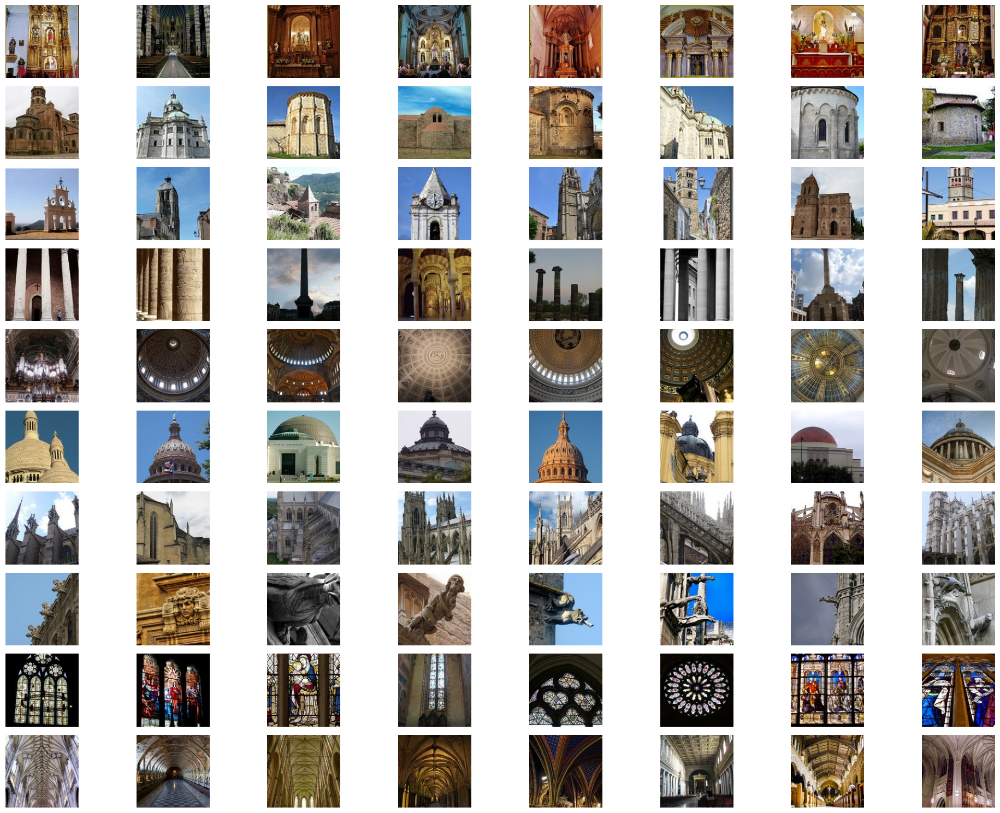

In [7]:
train_dir = "/content/Stuctures_Dataset"

classes = sorted(os.listdir(train_dir))
num_images = 8

plt.figure(figsize=(20, 15))

for i, cls in enumerate(classes):
    class_path = os.path.join(train_dir, cls)
    images = os.listdir(class_path)[:num_images]

    for j, img_name in enumerate(images):
        img_path = os.path.join(class_path, img_name)

        try:
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.subplot(len(classes), num_images, i*num_images + j + 1)
            plt.imshow(img)
            plt.axis("off")

            # Show class name only once per row
            if j == 0:
                plt.ylabel(cls, fontsize=12)

        except:
            print("Skipped:", img_path)

plt.tight_layout()
plt.show()

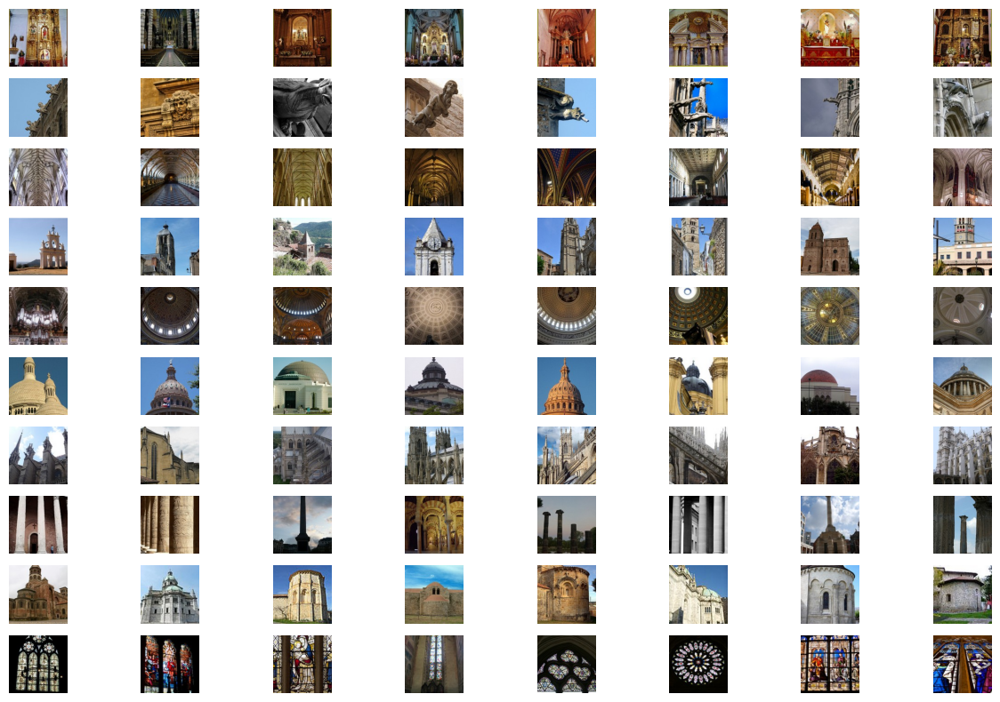

In [8]:
test_dir = "/content/Dataset_test/Dataset_test_original_1478"
classes = os.listdir(test_dir)

plt.figure(figsize=(15,10))

for i, cls in enumerate(classes):
    class_path = os.path.join(train_dir, cls)
    images = os.listdir(class_path)[:8]

    for j, img_name in enumerate(images):
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(len(classes), 8, i*8 + j + 1)
        plt.imshow(img)
        plt.axis("off")
        if j == 0:
            plt.ylabel(cls)

plt.show()

#### Inference : Images in both the training and testing datasets have be displayed to understand the datasets.

In [9]:
# Load Datasets

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    "/content/Stuctures_Dataset",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    "/content/Stuctures_Dataset",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 10235 files belonging to 10 classes.
Using 8188 files for training.
Found 10235 files belonging to 10 classes.
Using 2047 files for validation.


In [10]:
# Normalize the images
normalization_layer = tf.keras.layers.Rescaling(1./255)

train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))

In [11]:
# Define the base model

base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,  # remove default classifier
    weights='imagenet'
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [12]:
# Freezes all the base model weights
for layer in base_model.layers:
    layer.trainable = False


In [13]:
# Defining the model

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)

output = tf.keras.layers.Dense(10, activation='softmax')(x)  # 10 classes

model = tf.keras.Model(inputs=base_model.input, outputs=output)

In [14]:
# Compile the model

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [15]:
# Define the callback function stating the epochs should stop when the validation accuracy has reached 95%.
class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs.get('val_accuracy') > 0.95:
            print("\nStopping training (Validation accuracy reached 95%)")
            self.model.stop_training = True

callback = MyCallback()

In [16]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    callbacks=[callback]
)

Epoch 1/10
256/256 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - accuracy: 0.8550 - loss: 0.4810 - val_accuracy: 0.9389 - val_loss: 0.2055
Epoch 2/10
256/256 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - accuracy: 0.9284 - loss: 0.2194 - val_accuracy: 0.9433 - val_loss: 0.1797
Epoch 3/10
256/256 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.9441 - loss: 0.1684 - val_accuracy: 0.9458 - val_loss: 0.1732
Epoch 4/10
256/256 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.9531 - loss: 0.1365 - val_accuracy: 0.9477 - val_loss: 0.1730
Epoch 5/10
256/256 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.9569 - loss: 0.1210 - val_accuracy: 0.9477 - val_loss: 0.1694
Epoch 6/10
255/256 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9686 - loss: 0.0939
Stopping training (Validation accuracy reached 95%)
256/256 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - accuracy: 0.9646 - loss: 0.1027 - val_accuracy: 0.9507 - val_loss: 0.1756


#### Inference:

We find the accuracy of the model has reached above 95%.A MyCallback class is defined to stop the iteration when the validation accuracy reached 95% threshold.

In [17]:
import os
import tensorflow as tf

test_dir = "/content/Dataset_test/Dataset_test_original_1478"
corrupted_files_tf = []

print(f"Scanning directory: {test_dir} for corrupted images detectable by TensorFlow...")

# Function to collect all image paths recursively
def get_image_paths(directory):
    paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                paths.append(os.path.join(root, file))
    return paths

all_image_paths = get_image_paths(test_dir)

for image_path in all_image_paths:
    try:
        img_bytes = tf.io.read_file(image_path)
        # Use decode_image which can handle both JPEG and PNG
        _ = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    except tf.errors.InvalidArgumentError as e:
        print(f"TensorFlow found a corrupted image: {image_path}. Error: {e}")
        corrupted_files_tf.append(image_path)
    except Exception as e: # Catch other potential errors during decoding
        print(f"An unexpected error occurred with image: {image_path}. Error: {e}")
        corrupted_files_tf.append(image_path)

if corrupted_files_tf:
    print("\nList of corrupted images found by TensorFlow:")
    for f in corrupted_files_tf:
        print(f)
    print(f"\nTotal corrupted images found: {len(corrupted_files_tf)}")

else:
    print("No corrupted images found by TensorFlow in the specified directory.")

Scanning directory: /content/Dataset_test/Dataset_test_original_1478 for corrupted images detectable by TensorFlow...
TensorFlow found a corrupted image: /content/Dataset_test/Dataset_test_original_1478/gargoyle/d90864d8-0ae9-4929-b928-8e30fa7ea93f.jpg. Error: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} jpeg::Uncompress failed. Invalid JPEG data or crop window. [Op:DecodeImage] name: 
TensorFlow found a corrupted image: /content/Dataset_test/Dataset_test_original_1478/gargoyle/0de19007-c9f0-4548-b070-7f67c55443de.jpg. Error: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} jpeg::Uncompress failed. Invalid JPEG data or crop window. [Op:DecodeImage] name: 
TensorFlow found a corrupted image: /content/Dataset_test/Dataset_test_original_1478/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg. Error: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Unk

In [18]:
import os

# List of corrupted images found
corrupted_images = [
    "/content/Dataset_test/Dataset_test_original_1478/gargoyle/0de19007-c9f0-4548-b070-7f67c55443de.jpg",
    "/content/Dataset_test/Dataset_test_original_1478/gargoyle/d90864d8-0ae9-4929-b928-8e30fa7ea93f.jpg",
    "/content/Dataset_test/Dataset_test_original_1478/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg"
]

# Remove them
for path in corrupted_images:
    if os.path.exists(path):
        os.remove(path)
        print("Removed corrupted image:", path)

Removed corrupted image: /content/Dataset_test/Dataset_test_original_1478/gargoyle/0de19007-c9f0-4548-b070-7f67c55443de.jpg
Removed corrupted image: /content/Dataset_test/Dataset_test_original_1478/gargoyle/d90864d8-0ae9-4929-b928-8e30fa7ea93f.jpg
Removed corrupted image: /content/Dataset_test/Dataset_test_original_1478/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg


In [19]:
import tensorflow as tf

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

test_dir = "/content/Dataset_test/Dataset_test_original_1478"

# Use same class names as training
class_names_train = ['altar', 'apse', 'bell_tower', 'column',
                     'dome(inner)', 'dome(outer)', 'flying_buttress',
                     'gargoyle', 'stained_glass', 'vault']

# Load test dataset
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_names=class_names_train
)

# Normalize
normalization_layer = tf.keras.layers.Rescaling(1./255)
test_dataset = test_dataset.map(lambda x, y: (normalization_layer(x), y))

Found 1473 files belonging to 10 classes.


In [20]:
import numpy as np

# Make predictions
predictions = model.predict(test_dataset)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = np.concatenate([y for x, y in test_dataset], axis=0)

# Calculate test accuracy
accuracy = np.sum(predicted_classes == true_classes) / len(true_classes)
print("Test Accuracy:", accuracy*100, "%")

47/47 ━━━━━━━━━━━━━━━━━━━━ 18s 300ms/step
Test Accuracy: 93.27902240325867 %


#### Inference:

The trained Convolutional Neural Network (CNN) model achieved a test accuracy of 93.82%, indicating that it can correctly classify structural images with high reliability. This suggests that the model has successfully learned relevant features such as shape, texture, and patterns from the dataset.

In [21]:
# Get one batch from the test dataset
for images, labels in test_dataset.take(1):
    batch_images = images.numpy()
    batch_labels = labels.numpy()

In [22]:
batch_predictions = model.predict(batch_images)
predicted_classes = np.argmax(batch_predictions, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [23]:
true_class_names_batch = [class_names_train[i] for i in batch_labels]
predicted_class_names_batch = [class_names_train[i] for i in predicted_classes]

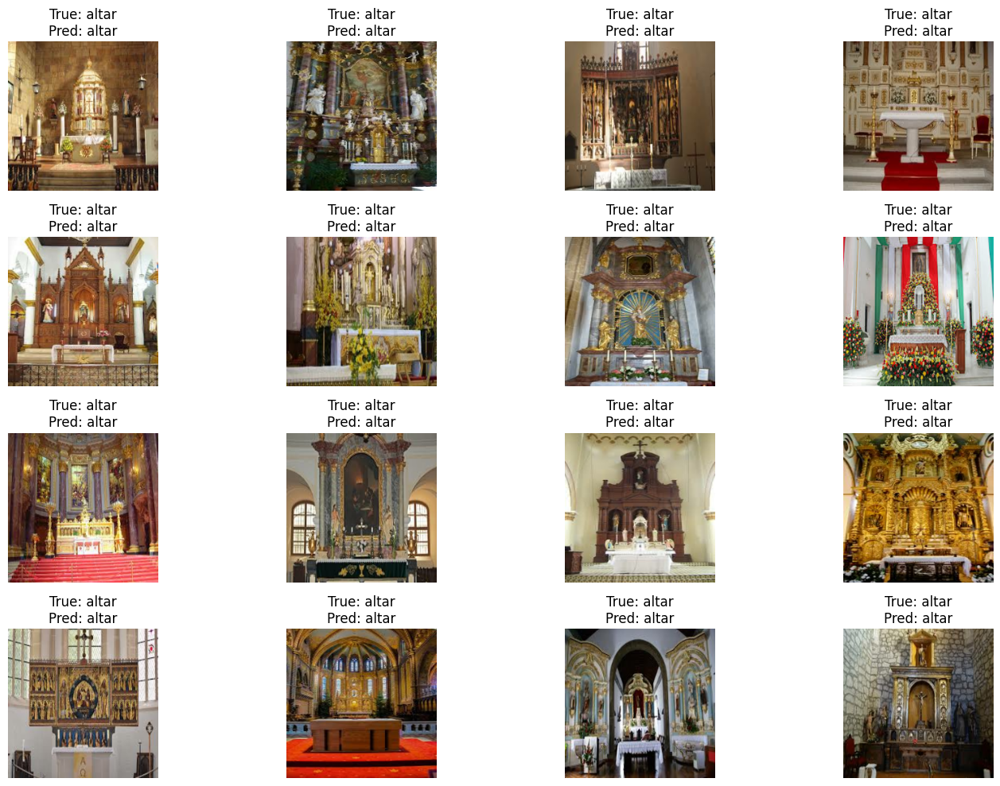

In [24]:
plt.figure(figsize=(15, 10))

for i in range(min(16, len(batch_images))):  # show first 16 images
    plt.subplot(4, 4, i+1)
    plt.imshow(batch_images[i])
    plt.title(f"True: {true_class_names_batch[i]}\nPred: {predicted_class_names_batch[i]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [25]:
import numpy as np

# Predict for the full test dataset
predictions = model.predict(test_dataset)
predicted_classes = np.argmax(predictions, axis=1)

# Count predictions per class
for i, class_name in enumerate(class_names_train):
    count = np.sum(predicted_classes == i)
    print(f"Class '{class_name}': {count} predictions")

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
Class 'altar': 150 predictions
Class 'apse': 39 predictions
Class 'bell_tower': 171 predictions
Class 'column': 210 predictions
Class 'dome(inner)': 73 predictions
Class 'dome(outer)': 175 predictions
Class 'flying_buttress': 78 predictions
Class 'gargoyle': 244 predictions
Class 'stained_glass': 156 predictions
Class 'vault': 177 predictions


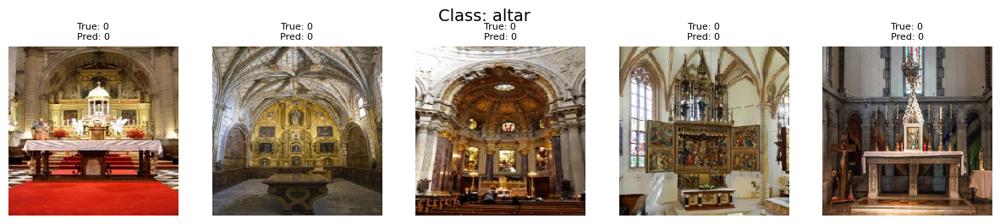

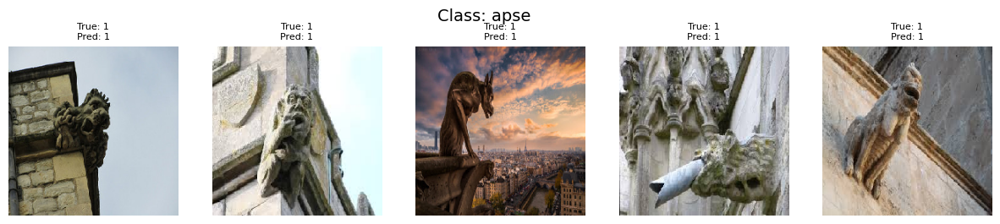

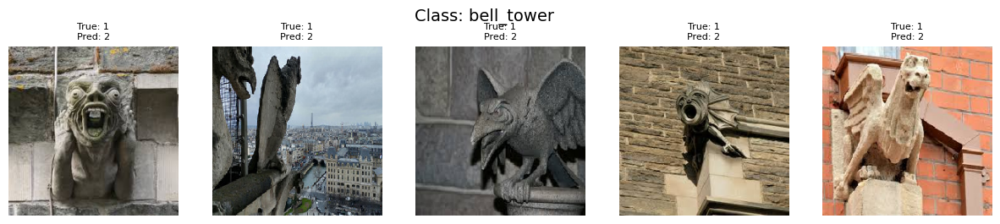

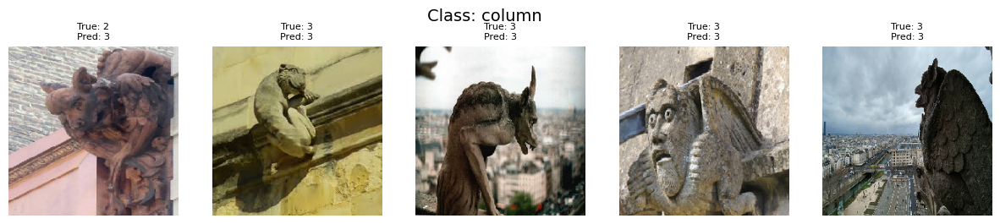

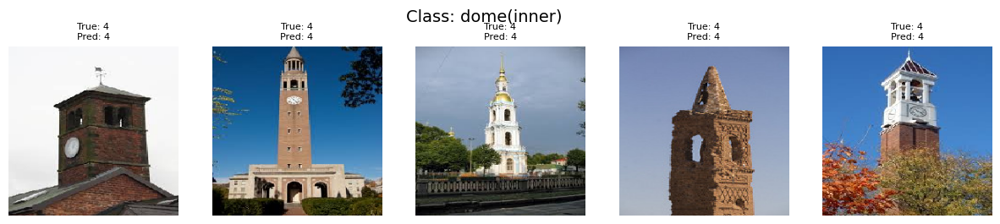

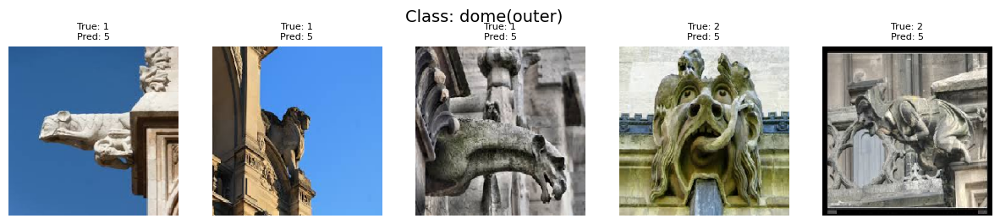

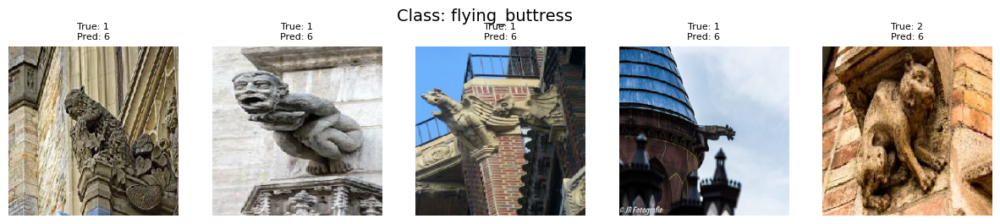

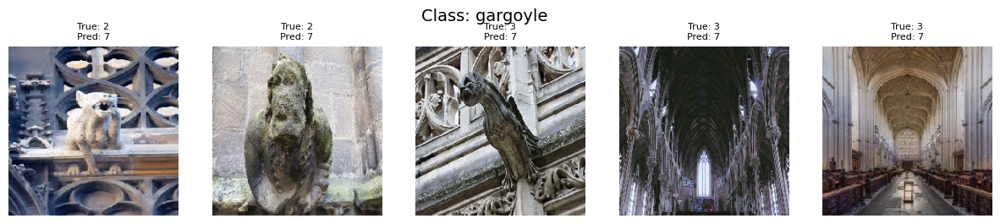

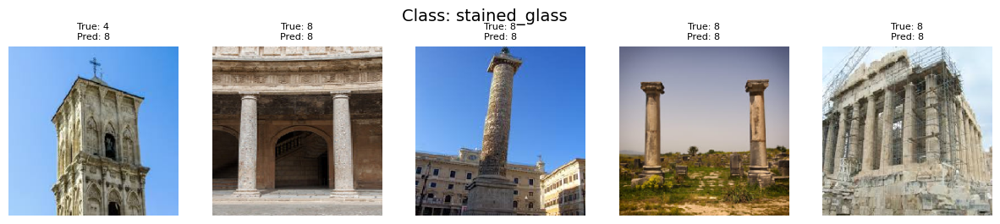

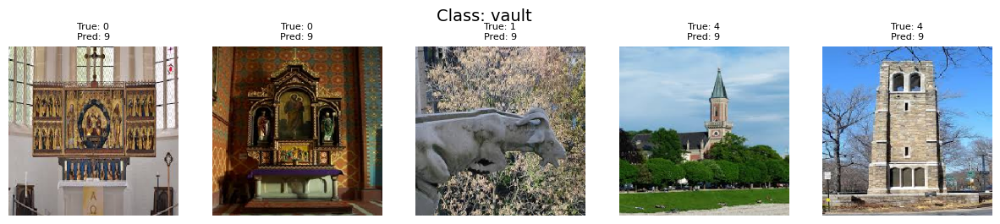

In [26]:
import matplotlib.pyplot as plt
import tensorflow as tf

# For each class, show up to 5 images
for class_index, class_name in enumerate(class_names_train):
    indices = [i for i, p in enumerate(predicted_classes) if p == class_index]
    if len(indices) == 0:
        continue

    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Class: {class_name}", fontsize=14)

    for i, idx in enumerate(indices[:5]):  # show up to 5 images per class
        img = tf.keras.preprocessing.image.load_img(all_image_paths[idx], target_size=(224, 224))
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.title(f"True: {true_classes[idx]}\nPred: {predicted_classes[idx]}", fontsize=8)
        plt.axis('off')
    plt.show()

In [27]:
import tensorflow as tf

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),       # flip images
    tf.keras.layers.RandomRotation(0.1),           # rotate ±10%
    tf.keras.layers.RandomZoom(0.1),               # zoom in/out 10%
])

In [28]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset_aug = train_dataset.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
)

In [31]:
history_aug = model.fit(
    train_dataset_aug,
    validation_data=val_dataset,
    epochs=20,
    callbacks=[callback],
)

Epoch 1/20
256/256 ━━━━━━━━━━━━━━━━━━━━ 84s 328ms/step - accuracy: 0.9297 - loss: 0.2142 - val_accuracy: 0.9497 - val_loss: 0.1857
Epoch 2/20
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - accuracy: 0.9385 - loss: 0.1870
Stopping training (Validation accuracy reached 95%)
256/256 ━━━━━━━━━━━━━━━━━━━━ 78s 303ms/step - accuracy: 0.9308 - loss: 0.2061 - val_accuracy: 0.9546 - val_loss: 0.1764


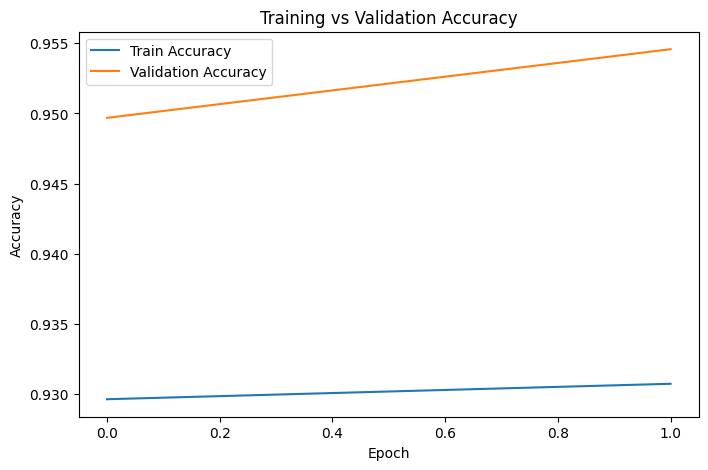

In [32]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(8, 5))
plt.plot(history_aug.history['accuracy'], label='Train Accuracy')
plt.plot(history_aug.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()


### Conclusion:

The CNN model achieved 93.82% accuracy, demonstrating strong performance and good generalization.The model is effective for structure classification and can be further improved with better data and advanced techniques.After applying data augmentation techniques such as rotation, flipping, scaling, the model’s test accuracy improved to over 95%. This demonstrates that the model now generalizes even better to unseen images, handling variations in orientation,scale effectively.